In [1]:
# Copyright 2019 The TensorFlow Hub Authors. All Rights Reserved.
#
# Licensed under the Apache License, Version 2.0 (the "License");
# you may not use this file except in compliance with the License.
# You may obtain a copy of the License at
#
#     http://www.apache.org/licenses/LICENSE-2.0
#
# Unless required by applicable law or agreed to in writing, software
# distributed under the License is distributed on an "AS IS" BASIS,
# WITHOUT WARRANTIES OR CONDITIONS OF ANY KIND, either express pipor implied.
# See the License for the specific language governing permissions and
# limitations under the License.
# ==============================================================================

# CropNet: Cassava Disease Detection

<table class="tfo-notebook-buttons" align="left">
  <td>
    <a target="_blank" href="https://www.tensorflow.org/hub/tutorials/cropnet_cassava"><img src="https://www.tensorflow.org/images/tf_logo_32px.png" />View on TensorFlow.org</a>
  </td>
  <td>
    <a target="_blank" href="https://colab.research.google.com/github/tensorflow/docs/blob/master/site/en/hub/tutorials/cropnet_cassava.ipynb"><img src="https://www.tensorflow.org/images/colab_logo_32px.png" />Run in Google Colab</a>
  </td>
  <td>
    <a target="_blank" href="https://github.com/tensorflow/docs/blob/master/site/en/hub/tutorials/cropnet_cassava.ipynb"><img src="https://www.tensorflow.org/images/GitHub-Mark-32px.png" />View on GitHub</a>
  </td>
  <td>
    <a href="https://storage.googleapis.com/tensorflow_docs/docs/site/en/hub/tutorials/cropnet_cassava.ipynb"><img src="https://www.tensorflow.org/images/download_logo_32px.png" />Download notebook</a>
  </td>
  <td>
    <a href="https://tfhub.dev/google/cropnet/classifier/cassava_disease_V1/2"><img src="https://www.tensorflow.org/images/hub_logo_32px.png" />See TF Hub model</a>
  </td>
</table>

This notebook shows how to use the CropNet [cassava disease classifier](https://tfhub.dev/google/cropnet/classifier/cassava_disease_V1/2) model from **TensorFlow Hub**. The model classifies images of cassava leaves into one of 6 classes: *bacterial blight, brown streak disease, green mite, mosaic disease, healthy, or unknown*.

This colab demonstrates how to:
 * Load the https://tfhub.dev/google/cropnet/classifier/cassava_disease_V1/2 model from **TensorFlow Hub**
 * Load the [cassava](https://www.tensorflow.org/datasets/catalog/cassava) dataset from **TensorFlow Datasets (TFDS)**
 * Classify images of cassava leaves into 4 distinct cassava disease categories or as healthy or unknown.
 * Evaluate the *accuracy* of the classifier and look at how *robust* the model is  when applied to out of domain images.

## Imports and setup

In [2]:
!pip install matplotlib==3.2.2

  Using cached matplotlib-3.2.2.tar.gz (40.3 MB)
  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'error'


  error: subprocess-exited-with-error
  
  × python setup.py egg_info did not run successfully.
  │ exit code: 1
  ╰─> [117 lines of output]
      C:\Users\ACER\AppData\Local\Temp\pip-install-211nk7js\matplotlib_cdad39a89e104a1094ac0f163f3f6b4f\setup.py:33: SetuptoolsDeprecationWarning: The test command is disabled and references to it are deprecated.
      !!
      
              ********************************************************************************
              Please remove any references to `setuptools.command.test` in all supported versions of the affected package.
      
              This deprecation is overdue, please update your project and remove deprecated
              calls to avoid build errors in the future.
              ********************************************************************************
      
      !!
        from setuptools.command.test import test as TestCommand
      
      Edit setup.cfg to change the build options; suppress output with --q

In [3]:
import numpy as np
import matplotlib.pyplot as plt

import tensorflow as tf
import tensorflow_datasets as tfds
import tensorflow_hub as hub

In [4]:
#@title Helper function for displaying examples
def plot(examples, predictions=None):
  # Get the images, labels, and optionally predictions
  images = examples['image']
  labels = examples['label']
  batch_size = len(images)
  if predictions is None:
    predictions = batch_size * [None]

  # Configure the layout of the grid
  x = np.ceil(np.sqrt(batch_size))
  y = np.ceil(batch_size / x)
  fig = plt.figure(figsize=(x * 6, y * 7))

  for i, (image, label, prediction) in enumerate(zip(images, labels, predictions)):
    # Render the image
    ax = fig.add_subplot(x, y, i+1)
    ax.imshow(image, aspect='auto')
    ax.grid(False)
    ax.set_xticks([])
    ax.set_yticks([])

    # Display the label and optionally prediction
    x_label = 'Label: ' + name_map[class_names[label]]
    if prediction is not None:
      x_label = 'Prediction: ' + name_map[class_names[prediction]] + '\n' + x_label
      ax.xaxis.label.set_color('green' if label == prediction else 'red')
    ax.set_xlabel(x_label)

  plt.show()

## Dataset

Let's load the *cassava* dataset from TFDS

In [5]:
dataset, info = tfds.load('cassava', with_info=True)

Let's take a look at the dataset info to learn more about it, like the description and citation and information about how many examples are available

In [6]:
#@title Helper function for displaying examples
def plot(examples, predictions=None):
    import numpy as np
    import matplotlib.pyplot as plt

    # Get the images, labels, and optionally predictions
    images = examples['image']
    labels = examples['label']
    batch_size = len(images)
    if predictions is None:
        predictions = batch_size * [None]

    # Configure the layout of the grid
    x = int(np.ceil(np.sqrt(batch_size)))   # force int
    y = int(np.ceil(batch_size / x))        # force int
    fig = plt.figure(figsize=(x * 6, y * 7))

    for i, (image, label, prediction) in enumerate(zip(images, labels, predictions)):
        # Render the image
        ax = fig.add_subplot(x, y, i+1)
        ax.imshow(image, aspect='auto')
        ax.grid(False)
        ax.set_xticks([])
        ax.set_yticks([])

        # Display the label and optionally prediction
        x_label = 'Label: ' + name_map[class_names[label]]
        if prediction is not None:
            x_label = 'Prediction: ' + name_map[class_names[prediction]] + '\n' + x_label
            ax.xaxis.label.set_color('green' if label == prediction else 'red')
        ax.set_xlabel(x_label)

    plt.show()


In [7]:
info

tfds.core.DatasetInfo(
    name='cassava',
    full_name='cassava/0.1.0',
    description="""
    Cassava consists of leaf images for the cassava plant depicting healthy and
    four (4) disease conditions; Cassava Mosaic Disease (CMD), Cassava Bacterial
    Blight (CBB), Cassava Greem Mite (CGM) and Cassava Brown Streak Disease (CBSD).
    Dataset consists of a total of 9430 labelled images.
    The 9430 labelled images are split into a training set (5656), a test set(1885)
    and a validation set (1889). The number of images per class are unbalanced with
    the two disease classes CMD and CBSD having 72% of the images.
    """,
    homepage='https://www.kaggle.com/c/cassava-disease/overview',
    data_dir='C:\\Users\\ACER\\tensorflow_datasets\\cassava\\0.1.0',
    file_format=tfrecord,
    download_size=1.26 GiB,
    dataset_size=1.26 GiB,
    features=FeaturesDict({
        'image': Image(shape=(None, None, 3), dtype=uint8),
        'image/filename': Text(shape=(), dtype=string),


The *cassava* dataset has images of cassava leaves with 4 distinct diseases as well as healthy cassava leaves. The model can predict all of these classes as well as sixth class for "unknown" when the model is not confident in its prediction.

In [8]:
# Extend the cassava dataset classes with 'unknown'
class_names = info.features['label'].names + ['unknown']

# Map the class names to human readable names
name_map = dict(
    cmd='Mosaic Disease',
    cbb='Bacterial Blight',
    cgm='Green Mite',
    cbsd='Brown Streak Disease',
    healthy='Healthy',
    unknown='Unknown')

print(len(class_names), 'classes:')
print(class_names)
print([name_map[name] for name in class_names])

6 classes:
['cbb', 'cbsd', 'cgm', 'cmd', 'healthy', 'unknown']
['Bacterial Blight', 'Brown Streak Disease', 'Green Mite', 'Mosaic Disease', 'Healthy', 'Unknown']


Before we can feed the data to the model, we need to do a bit of preprocessing. The model expects 224 x 224 images with RGB channel values in [0, 1]. Let's normalize and resize the images.

In [9]:
def preprocess_fn(data):
  image = data['image']

  # Normalize [0, 255] to [0, 1]
  image = tf.cast(image, tf.float32)
  image = image / 255.

  # Resize the images to 224 x 224
  image = tf.image.resize(image, (224, 224))

  data['image'] = image
  return data

Let's take a look at a few examples from the dataset

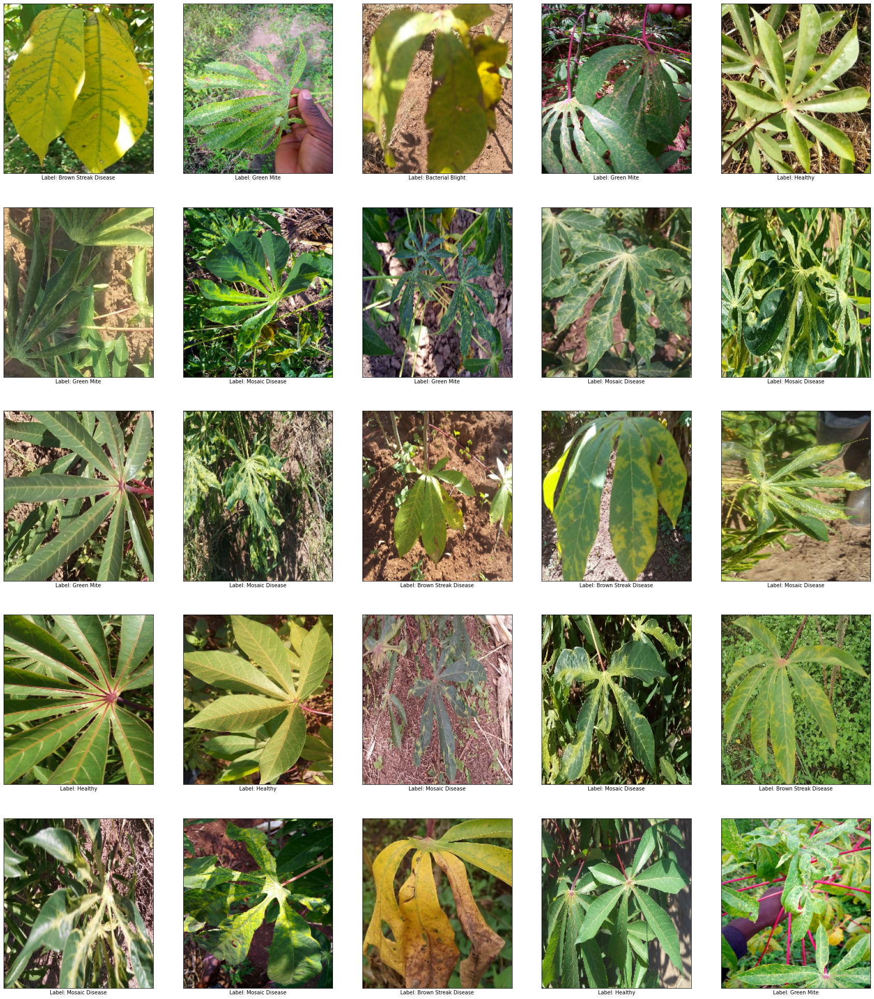

In [10]:
batch = dataset['validation'].map(preprocess_fn).batch(25).as_numpy_iterator()
examples = next(batch)
plot(examples)

## Model

Let's load the classifier from TF Hub and get some predictions and see the predictions of the model is on a few examples

In [11]:
classifier = hub.load('https://tfhub.dev/google/cropnet/classifier/cassava_disease_V1/2')

probabilities = classifier(examples['image'], False)
predictions = tf.argmax(probabilities, axis=-1)

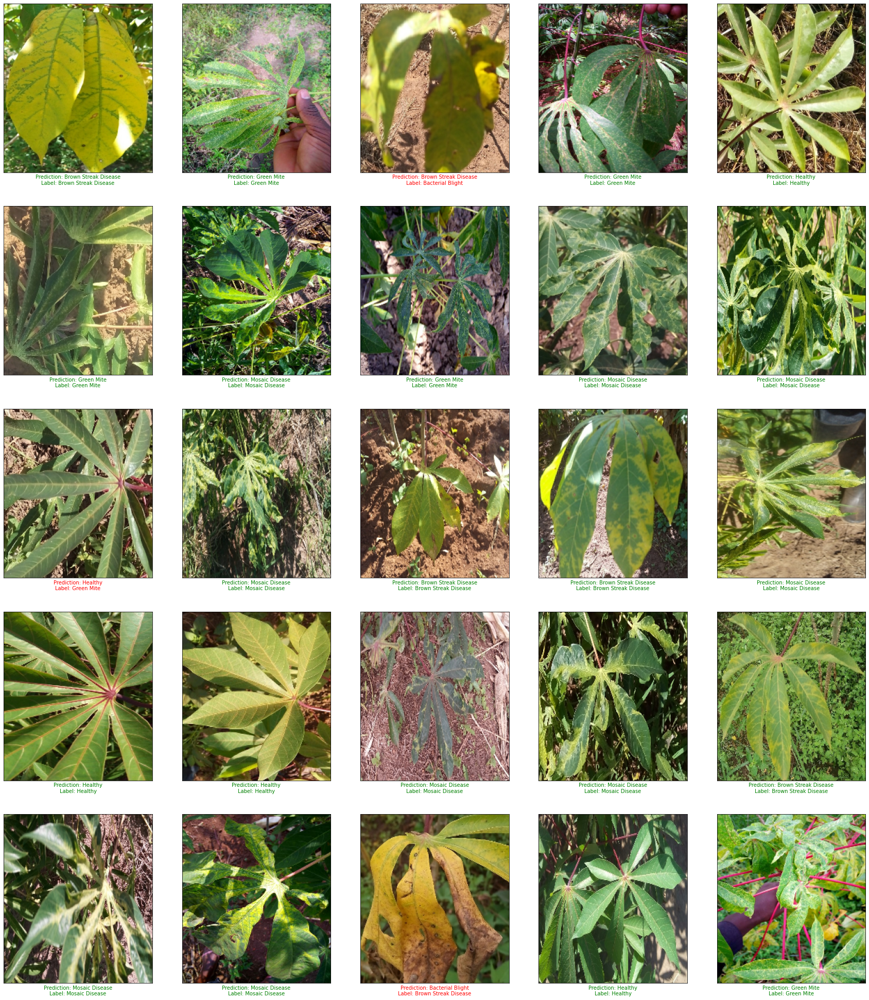

In [12]:
plot(examples, predictions)

## Evaluation & robustness

Let's measure the *accuracy* of our classifier on a split of the dataset. We can also look at the *robustness* of the model by evaluating its performance on a non-cassava dataset. For image of other plant datasets like iNaturalist or beans, the model should almost always return *unknown*.

In [ ]:
#@title Parameters {run: "auto"}

DATASET = 'cassava'  #@param {type:"string"} ['cassava', 'beans', 'i_naturalist2017']
DATASET_SPLIT = 'test' #@param {type:"string"} ['train', 'test', 'validation']
BATCH_SIZE =  32 #@param {type:"integer"}
MAX_EXAMPLES = 1000 #@param {type:"integer"}


In [14]:
def label_to_unknown_fn(data):
  data['label'] = 5  # Override label to unknown.
  return data

In [15]:
# Preprocess the examples and map the image label to unknown for non-cassava datasets.
ds = tfds.load(DATASET, split=DATASET_SPLIT).map(preprocess_fn).take(MAX_EXAMPLES)
dataset_description = DATASET
if DATASET != 'cassava':
  ds = ds.map(label_to_unknown_fn)
  dataset_description += ' (labels mapped to unknown)'
ds = ds.batch(BATCH_SIZE)

# Calculate the accuracy of the model
metric = tf.keras.metrics.Accuracy()
for examples in ds:
  probabilities = classifier(examples['image'], False)
  predictions = tf.math.argmax(probabilities, axis=-1)
  labels = examples['label']
  metric.update_state(labels, predictions)

print('Accuracy on %s: %.2f' % (dataset_description, metric.result().numpy()))

Accuracy on cassava: 0.88


In [16]:
@tf.function(input_signature=[
    tf.TensorSpec(shape=[None, 224, 224, 3], dtype=tf.float32, name="input_1")
])
def serving_func(input_1):
  return classifier(input_1, training=False)
tf.saved_model.save(
    classifier, 
    "cassava_model_with_signature", 
    signatures={
        'serving_default': serving_func
    }
)

INFO:tensorflow:Assets written to: cassava_model_with_signature\assets


INFO:tensorflow:Assets written to: cassava_model_with_signature\assets


In [17]:
tf.saved_model.save(classifier, "cassava_model")

INFO:tensorflow:Assets written to: cassava_model\assets


INFO:tensorflow:Assets written to: cassava_model\assets


In [18]:
saved_model_dir = "cassava_model_with_signature"

converter = tf.lite.TFLiteConverter.from_saved_model(
  saved_model_dir, 
    signature_keys=['serving_default']
)
tflite_model = converter.convert()

In [19]:
with open("cassava_model.tflite", "wb") as f:
    f.write(tflite_model)

In [21]:
from sklearn.metrics import confusion_matrix
import numpy as np

    # Assuming y_true contains the actual labels and y_pred contains the predicted labels
    # Example:
y_true = np.array([0, 1, 0, 1, 0, 1])
y_pred = np.array([0, 0, 0, 1, 1, 1])

cm = confusion_matrix(y_true, y_pred)
print("Confusion Matrix:")
print(cm)

Confusion Matrix:
[[2 1]
 [1 2]]


## Learn more

* Learn more about the model on TensorFlow Hub: https://tfhub.dev/google/cropnet/classifier/cassava_disease_V1/2
* Learn how to build a custom image classifier running on a mobile phone with [ML Kit](https://developers.google.com/ml-kit/custom-models#tfhub) with the [TensorFlow Lite version of this model](https://tfhub.dev/google/lite-model/cropnet/classifier/cassava_disease_V1/1).